In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from matrix_builder import create_expanded_feature_matrix, create_feature_matrix

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Load Database
csv_hour_file = '../data/ta_metrics/final_price_ta_metrics.csv'
df = pd.read_csv(csv_hour_file, parse_dates=['Datetime'])

def random_forest_training_fe(df, model, sliding_window, lag_price_window, DEBUG):
    """
    Train a Random Forest model using a sliding window approach.

    Parameters:
    - df: DataFrame containing the dataset with features and target variable.
    - model: The machine learning model to be trained (e.g., RandomForest).
    - sliding_window: Number of rows to use for training in each sliding window.
    - lag_price_window: Number of previous days to use as features.
    
    Returns:
    - prediction_df: DataFrame containing predictions and actual values.
    """
    if DEBUG:
        print("Debug mode is ON. Detailed output will be printed.")

    # Validate input parameters
    if sliding_window <= lag_price_window:
        raise ValueError("Sliding window must be greater than to the price feature window.")

    training_sliding_window = sliding_window + 1  # +1 to include the next row as the test set

    # Calculate number of sliding window models to train in the dataset
    num_sliding_windows = len(df) - training_sliding_window
    if DEBUG:
        # Training for sliding windows and price feature window
        print(f"Training sliding window size: {training_sliding_window}, Price feature window size: {lag_price_window}")
        print(f"Number of rows in the dataset: {len(df)}")

    print(f"Number of models to train: {num_sliding_windows}")

    # Initialize lists to store predictions, actuals, and timestamps
    predictions_list = []
    actuals_list = []
    timestamps_list = []

    model = model  # This is done in order to use different model configurations of RandomForestRegressor

    for i in range(num_sliding_windows):
        if DEBUG:
            print(f"Processing sliding window {i + 1}/{num_sliding_windows}...")

        # Ensure we do not exceed the DataFrame length
        if i + training_sliding_window >= len(df):
            break  # Avoid index out of bounds
        
        sliding_window_set = df.iloc[i : i + training_sliding_window]

        if DEBUG:
            print(f"Sliding window should have {training_sliding_window} rows, got {len(sliding_window_set)} rows.")
            print(f"Sliding window set:\n{sliding_window_set}")
        
        # Create feature matrix and target variable for training
        X_train, y_train = create_expanded_feature_matrix(sliding_window_set, lag_price_window)
        if DEBUG:
            print(f"Feature matrix shape: {X_train.shape}, Target variable shape: {y_train.shape}")
            print(f"Feature matrix:\n{X_train.head()}")
            print(f"Target variable:\n{y_train.head()}")

        # Split for training and prediction
        X_train_fit = X_train.iloc[:-1]
        y_train_fit = y_train.iloc[:-1]

        X_to_predict = X_train.iloc[-1:]
        y_to_predict = y_train.iloc[-1]

        if DEBUG:
            print(f"Training features shape: {X_train_fit.shape}, Training target shape: {y_train_fit.shape}")
            print(f"Features to predict shape: {X_to_predict.shape}, Target to predict: {y_to_predict}")

        # Scale features for better convergence
        scaler = StandardScaler()
        X_train_fit_scaled = scaler.fit_transform(X_train_fit)
        X_to_predict_scaled = scaler.transform(X_to_predict)

        model.fit(X_train_fit_scaled, y_train_fit)
        y_predicted = model.predict(X_to_predict_scaled)
        
        # Add a lower bounds to set extreme negative predictions to 0, assuming prices cannot be negative
        if y_predicted[0] < 0:
            y_predicted[0] = 0

        # Store results
        predictions_list.append(y_predicted[0])
        actuals_list.append(y_to_predict)
        if 'Datetime' in sliding_window_set.columns:
            timestamps_list.append(sliding_window_set.iloc[-1]['Datetime'])
        else:
            timestamps_list.append(i + training_sliding_window - 1)

    # Create final prediction DataFrame
    prediction_df = pd.DataFrame({
        'Timestamp': timestamps_list,
        'Predicted': predictions_list,
        'Actual': actuals_list
    })

    return prediction_df



def random_forest_training_gt(df, model, sliding_window, lag_price_window, DEBUG):
    """
    Train a Random Forest model using a sliding window approach.

    Parameters:
    - df: DataFrame containing the dataset with features and target variable.
    - model: The machine learning model to be trained (e.g., RandomForest).
    - sliding_window: Number of rows to use for training in each sliding window.
    - lag_price_window: Number of previous days to use as features.
    
    Returns:
    - prediction_df: DataFrame containing predictions and actual values.
    """
    if DEBUG:
        print("Debug mode is ON. Detailed output will be printed.")

    # Validate input parameters
    if sliding_window <= lag_price_window:
        raise ValueError("Sliding window must be greater than to the price feature window.")

    training_sliding_window = sliding_window + 1  # +1 to include the next row as the test set

    # Calculate number of sliding window models to train in the dataset
    num_sliding_windows = len(df) - training_sliding_window
    if DEBUG:
        # Training for sliding windows and price feature window
        print(f"Training sliding window size: {training_sliding_window}, Price feature window size: {lag_price_window}")
        print(f"Number of rows in the dataset: {len(df)}")

    print(f"Number of models to train: {num_sliding_windows}")

    # Initialize lists to store predictions, actuals, and timestamps
    predictions_list = []
    actuals_list = []
    timestamps_list = []

    model = model  # This is done in order to use different model configurations of RandomForestRegressor

    for i in range(num_sliding_windows):
        if DEBUG:
            print(f"Processing sliding window {i + 1}/{num_sliding_windows}...")

        # Ensure we do not exceed the DataFrame length
        if i + training_sliding_window >= len(df):
            break  # Avoid index out of bounds
        
        sliding_window_set = df.iloc[i : i + training_sliding_window]

        if DEBUG:
            print(f"Sliding window should have {training_sliding_window} rows, got {len(sliding_window_set)} rows.")
            print(f"Sliding window set:\n{sliding_window_set}")
        
        # Create feature matrix and target variable for training
        X_train, y_train = create_feature_matrix(sliding_window_set, lag_price_window)
        if DEBUG:
            print(f"Feature matrix shape: {X_train.shape}, Target variable shape: {y_train.shape}")
            print(f"Feature matrix:\n{X_train.head()}")
            print(f"Target variable:\n{y_train.head()}")

        # Split for training and prediction
        X_train_fit = X_train.iloc[:-1]
        y_train_fit = y_train.iloc[:-1]

        X_to_predict = X_train.iloc[-1:]
        y_to_predict = y_train.iloc[-1]

        if DEBUG:
            print(f"Training features shape: {X_train_fit.shape}, Training target shape: {y_train_fit.shape}")
            print(f"Features to predict shape: {X_to_predict.shape}, Target to predict: {y_to_predict}")

        model.fit(X_train_fit, y_train_fit)
        y_predicted = model.predict(X_to_predict)
        
        # Add a lower bounds to set extreme negative predictions to 0, assuming prices cannot be negative
        if y_predicted[0] < 0:
            y_predicted[0] = 0

        # Store results
        predictions_list.append(y_predicted[0])
        actuals_list.append(y_to_predict)
        if 'Datetime' in sliding_window_set.columns:
            timestamps_list.append(sliding_window_set.iloc[-1]['Datetime'])
        else:
            timestamps_list.append(i + training_sliding_window - 1)

    # Create final prediction DataFrame
    prediction_df = pd.DataFrame({
        'Timestamp': timestamps_list,
        'Predicted': predictions_list,
        'Actual': actuals_list
    })

    return prediction_df

Baseline (Ground truth)

In [ ]:
# Debug parameter
DEBUG = False

# Define the Sliding Windows for the runs
sliding_windows = [7, 10, 15, 30, 90]  # of days to train on (matrix rows)
lag_price_windows = [1, 2, 4, 6]  # of previous days to use as features (matrix columns)
# lag_price_window must be less than sliding_window
percentiles = [99, 95, 85, 75]

# Random Forest hyperparameters
n_estimators = [100, 200, 300, 400]  # Number of trees in the Random Forest

max_depths = [None, 10, 20, 30]  # Maximum depth of the trees

# Random Forest model
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_jobs=-1, random_state=42)
# Set n_jobs=-1 to use all available cores for parallel processing
# Set random_state for reproducibility

for n_estimator in n_estimators:

    for max_depth in max_depths:
        # Set the model parameters
        model.set_params(n_estimators=n_estimator, max_depth=max_depth)
        print(f"\nRunning Random Forest with n_estimators: {n_estimator}, max_depth: {max_depth}")

        # Initialize results file path
        results_file = f"/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/baseline/random_forest_baseline_results_n_estimators_{n_estimator}_max_depth_{max_depth}.csv"

        # Check if results file already exists and load existing results
        try:
            existing_results_df = pd.read_csv(results_file)
            comprehensive_baseline_results = existing_results_df.to_dict('records')
            print(f"Loaded {len(comprehensive_baseline_results)} existing results for n_estimators {n_estimator}, max_depth {max_depth}.")
            
            # Create a set of completed combinations for quick lookup
            completed_combinations = set()
            for result in comprehensive_baseline_results:
                completed_combinations.add((result['sliding_window'], result['lag_price_window']))
            
        except FileNotFoundError:
            print(f"No existing results for n_estimators {n_estimator}, max_depth {max_depth}. Starting fresh...")
            comprehensive_baseline_results = []
            completed_combinations = set()

        # Set the number of estimators for the model
        model.set_params(n_estimators=n_estimator, max_depth=max_depth)
        # Print the current configuration
        print(f"Running Random Forest with n_estimators: {n_estimator}, max_depth: {max_depth}")

        for sliding_window in sliding_windows:
            for lag_price_window in lag_price_windows:
                # Skip if this combination has already been completed
                if (sliding_window, lag_price_window) in completed_combinations:
                    print(f"Skipping already completed combination: sliding_window={sliding_window}, lag_price_window={lag_price_window}")
                    continue
                    
                print(f"\nRunning regression training with sliding window: {sliding_window}, price feature window: {lag_price_window}")

                # Run the regression training
                prediction_df = random_forest_training_gt(df, model, sliding_window, lag_price_window, DEBUG)

                # Calculate overall metrics
                actuals_list = prediction_df['Actual'].values
                predictions_list = prediction_df['Predicted'].values
                timestamps_list = prediction_df['Timestamp'].values

                mse = mean_squared_error(actuals_list, predictions_list)
                mae = mean_absolute_error(actuals_list, predictions_list)
                r2 = r2_score(actuals_list, predictions_list)

                # Calculate prediction errors for filtering
                prediction_errors = np.abs(np.array(predictions_list) - np.array(actuals_list))
                # Store results for this combination
                combination_results = []

                # Calculate ES-like metric using prediction_errors
                # FIXED: Calculate worst 5% of errors across all predictions
                worst_overall_error_threshold = np.percentile(prediction_errors, 95)  # worst 5% of errors
                worst_overall_indices = prediction_errors >= worst_overall_error_threshold
                avg_worst_error = np.mean(prediction_errors[worst_overall_indices])

                # Add overall results (100% percentile)
                combination_results.append({
                    'sliding_window': sliding_window,
                    'lag_price_window': lag_price_window,
                    'n_estimators': n_estimator,
                    'max_depth': max_depth,
                    'percentile': 100,
                    'data_points': len(predictions_list),
                    'mse': mse,
                    'mae': mae,
                    'r2': r2,
                    'worst_avg_error': avg_worst_error
                })

                for p in percentiles:
                    # Filter by best predictions (lowest errors)
                    best_error_threshold = np.percentile(prediction_errors, p)
                    
                    # Get indices of best predictions 
                    best_indices = prediction_errors <= best_error_threshold

                    filtered_actuals = np.array(actuals_list)[best_indices]
                    filtered_predictions = np.array(predictions_list)[best_indices]
                    filtered_errors = prediction_errors[best_indices]

                    if len(filtered_actuals) > 0:
                        mse_p = mean_squared_error(filtered_actuals, filtered_predictions)
                        mae_p = mean_absolute_error(filtered_actuals, filtered_predictions)
                        r2_p = r2_score(filtered_actuals, filtered_predictions)
                        
                        # FIXED: Calculate worst 5% WITHIN the filtered subset
                        worst_5_percent_threshold = np.percentile(filtered_errors, 95)
                        worst_5_percent_indices = filtered_errors >= worst_5_percent_threshold
                        worst_5_percent_errors = filtered_errors[worst_5_percent_indices]
                        avg_worst_5_percent = np.mean(worst_5_percent_errors)

                        combination_results.append({
                            'sliding_window': sliding_window,
                            'lag_price_window': lag_price_window,
                            'n_estimators': n_estimator,
                            'max_depth': max_depth,
                            'percentile': p,
                            'data_points': len(filtered_predictions),
                            'mse': mse_p,
                            'mae': mae_p,
                            'r2': r2_p,
                            'worst_avg_error': avg_worst_5_percent  # FIXED: Now actually the average of worst 5%
                        })
                    else:
                        # Add entry for no data available
                        combination_results.append({
                            'sliding_window': sliding_window,
                            'lag_price_window': lag_price_window,
                            'n_estimators': n_estimator,
                            'max_depth': max_depth,
                            'percentile': p,
                            'data_points': 0,
                            'mse': np.nan,
                            'mae': np.nan,
                            'r2': np.nan,
                            'worst_avg_error': np.nan
                        })

                # Add this combination's results to the comprehensive list
                comprehensive_baseline_results.extend(combination_results)
                
                # Save results immediately after each combination
                results_df = pd.DataFrame(comprehensive_baseline_results)
                results_df.to_csv(results_file, index=False)
                print(f"Saved results for sliding_window={sliding_window}, lag_price_window={lag_price_window}")
                
                # Add to completed combinations
                completed_combinations.add((sliding_window, lag_price_window))

print(f"Completed all combinations for n_estimators={n_estimators}, and max_depths={max_depths}")


Running Random Forest with n_estimators: 100, max_depth: None
Loaded 100 existing results for n_estimators 100, max_depth None.
Running Random Forest with n_estimators: 100, max_depth: None
Skipping already completed combination: sliding_window=7, lag_price_window=1
Skipping already completed combination: sliding_window=7, lag_price_window=2
Skipping already completed combination: sliding_window=7, lag_price_window=4
Skipping already completed combination: sliding_window=7, lag_price_window=6
Skipping already completed combination: sliding_window=10, lag_price_window=1
Skipping already completed combination: sliding_window=10, lag_price_window=2
Skipping already completed combination: sliding_window=10, lag_price_window=4
Skipping already completed combination: sliding_window=10, lag_price_window=6
Skipping already completed combination: sliding_window=15, lag_price_window=1
Skipping already completed combination: sliding_window=15, lag_price_window=2
Skipping already completed combin

In [ ]:
# Import all results to one single DataFrame
comprehensive_gt_df = pd.DataFrame()

n_estimators = [100, 200, 300, 400]
max_depths = [None, 10, 20, 30]

# Add up all results for different configurations of n_estimators
for n_estimators in n_estimators:
    for max_depth in max_depths:
        try:
            results_df = pd.read_csv(f"/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/baseline/random_forest_baseline_results_n_estimators_{n_estimators}_max_depth_{max_depth}.csv")
            results_df['n_estimators'] = n_estimators  # Add n_estimators column
            results_df['max_depth'] = max_depth  # Add max_depth column
            comprehensive_gt_df = pd.concat([comprehensive_gt_df, results_df], ignore_index=True)
        except FileNotFoundError:
            print(f"Results file not found for n_estimators={n_estimators}, max_depth={max_depth}")
            
# Save comprehensive results
comprehensive_gt_df.to_csv('/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/baseline/random_forest_full_baseline_results.csv', index=False)
print(f"\nFinal results saved to 'random_forest_full_baseline_results.csv'")
print(f"Total combinations processed: {len(comprehensive_gt_df)}")


Final results saved to 'random_forest_full_baseline_results.csv'
Total combinations processed: 1600


In [4]:
# comprehensive_gt_df = pd.read_csv('code/final_metrics/3_randomforest/baseline/random_forest_full_baseline_results.csv')
comprehensive_gt_df = pd.read_csv('/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/baseline/random_forest_full_baseline_results.csv')

# Finding the optimal config - find models that are best in multiple metrics
def find_best_optimal_models(df, percentile=99):
    """Find models that are optimal in at least one metric"""
    subset = df[df['percentile'] == percentile].copy()
    
    # Rank by each metric (lower rank = better)
    subset['mae_rank'] = subset['mae'].rank(ascending=True)
    subset['mse_rank'] = subset['mse'].rank(ascending=True)  # Lower MSE is better
    subset['r2_rank'] = subset['r2'].rank(ascending=False)  # Higher R² is better
    subset['worst_error_rank'] = subset['worst_avg_error'].rank(ascending=True)
    
    # Find average rank across all 4 metrics
    subset['avg_rank'] = (subset['mae_rank'] + subset['mse_rank'] + 
                         subset['r2_rank'] + subset['worst_error_rank']) / 4
    
    return subset.sort_values('avg_rank')

# Get top models by multiple criteria
most_optimal_gt = find_best_optimal_models(comprehensive_gt_df)

print("Top 3 models by multi-criteria ranking (including MSE):")
# MSE to RMSE
most_optimal_gt['mse'] = np.sqrt(most_optimal_gt['mse'])  # Convert MSE to RMSE for better interpretability
print(most_optimal_gt[['sliding_window', 'lag_price_window', 'n_estimators', 'max_depth', 'mae', 'mse', 'r2', 'worst_avg_error', 'avg_rank']].head(3))

Top 3 models by multi-criteria ranking (including MSE):
      sliding_window  lag_price_window  n_estimators  max_depth        mae  \
1396              90                 6           400       10.0  16.600169   
1496              90                 6           400       20.0  16.613527   
996               90                 6           300       10.0  16.593735   

            mse        r2  worst_avg_error  avg_rank  
1396  24.656178  0.816223        70.241965     17.50  
1496  24.674793  0.815946        70.296317     19.25  
996   24.675835  0.815930        70.458239     20.00  


In [5]:
# Print optimal models
print("\nOptimal models (99% percentile):")
print(most_optimal_gt[['sliding_window', 'lag_price_window', 'n_estimators', 'max_depth', 'mae', 'mse', 'r2', 'worst_avg_error', 'avg_rank']])

# Save optimal models to CSV
most_optimal_gt.to_csv('random_forest_full_baseline_results_ranking.csv', index=False)


Optimal models (99% percentile):
      sliding_window  lag_price_window  n_estimators  max_depth        mae  \
1396              90                 6           400       10.0  16.600169   
1496              90                 6           400       20.0  16.613527   
996               90                 6           300       10.0  16.593735   
1596              90                 6           400       30.0  16.613670   
1296              90                 6           400        NaN  16.613670   
...              ...               ...           ...        ...        ...   
501                7                 1           200       10.0  17.494485   
901                7                 1           300       10.0  17.524499   
1001               7                 1           300       20.0  17.524499   
1101               7                 1           300       30.0  17.524499   
801                7                 1           300        NaN  17.524499   

            mse        r2  wo

In [6]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_jobs=-1, random_state=42)

# Select the best baseline model
best_baseline_sliding_window = int(most_optimal_gt.head(1)['sliding_window'].values[0])
best_baseline_lag_price_window = int(most_optimal_gt.head(1)['lag_price_window'].values[0])
best_baseline_n_estimators = int(most_optimal_gt.head(1)['n_estimators'].values[0])
best_baseline_max_depth = int(most_optimal_gt.head(1)['max_depth'].values[0])

# Print the best baseline model parameters
print(f"Best Baseline Model - Sliding Window: {best_baseline_sliding_window}, Lag Price Window: {best_baseline_lag_price_window}, N Estimators: {best_baseline_n_estimators}, Max Depth: {best_baseline_max_depth}")

# Re-configure the best model with the best parameters
best_baseline_model = RandomForestRegressor(n_estimators=best_baseline_n_estimators, max_depth=best_baseline_max_depth)

# Recalculate the best model predictions
prediction_df_best_baseline = random_forest_training_gt(df, best_baseline_model, best_baseline_sliding_window, best_baseline_lag_price_window, DEBUG=False)

Best Baseline Model - Sliding Window: 90, Lag Price Window: 6, N Estimators: 400, Max Depth: 10
Number of models to train: 2169


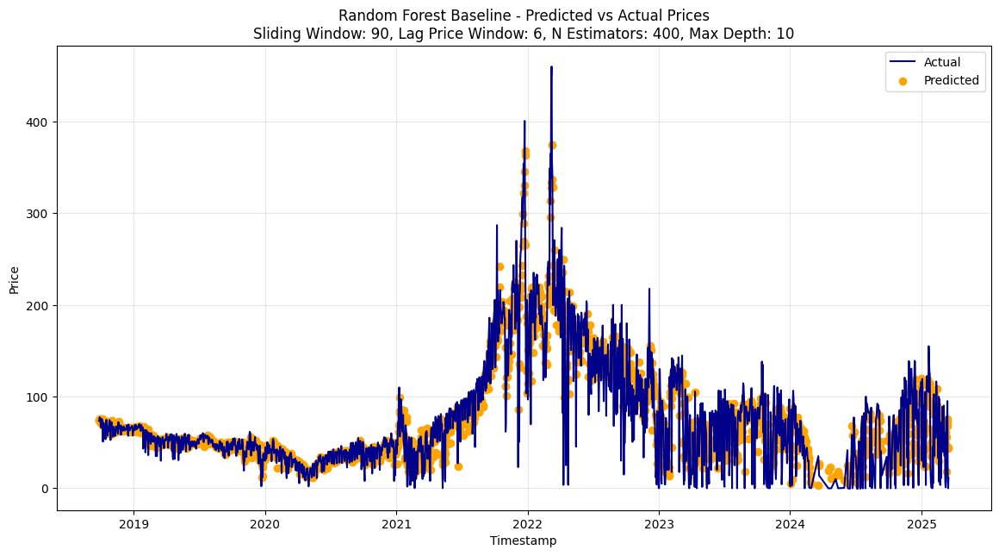

In [7]:
import matplotlib.pyplot as plt
# Plotting the predictions for the best model as scatter plot over the actuals as line plot
plt.figure(figsize=(14, 7))
plt.plot(prediction_df_best_baseline['Timestamp'], prediction_df_best_baseline['Actual'], label='Actual', color='darkblue')
plt.scatter(prediction_df_best_baseline['Timestamp'], prediction_df_best_baseline['Predicted'], label='Predicted', color='orange')
plt.title(f"Random Forest Baseline - Predicted vs Actual Prices\nSliding Window: {best_baseline_sliding_window}, Lag Price Window: {best_baseline_lag_price_window}, N Estimators: {best_baseline_n_estimators}, Max Depth: {best_baseline_max_depth}")
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig('random_forest_baseline_best_model.png', dpi=300, bbox_inches='tight')
plt.show()

Feature engineering version:

In [ ]:
# Debug parameter
DEBUG = False

# Define the Sliding Windows for the runs
sliding_windows = [7, 10, 15, 30, 90]  # of days to train on (matrix rows)
lag_price_windows = [1, 2, 4, 6]  # of previous days to use as features (matrix columns)
# lag_price_window must be less than sliding_window
percentiles = [99, 95, 85, 75]

# Random Forest hyperparameters
n_estimators = [100, 200, 300, 400]  # Number of trees in the Random Forest

max_depths = [None, 10, 20, 30]  # Maximum depth of the trees

# Random Forest model
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_jobs=-1, random_state=42)

for n_estimator in n_estimators:

    for max_depth in max_depths:
        # Set the model parameters
        model.set_params(n_estimators=n_estimator, max_depth=max_depth)
        print(f"\nRunning Random Forest with n_estimators: {n_estimator}, max_depth: {max_depth}")

        # Initialize results file path
        results_file = f"/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/baseline/random_forest_baseline_results_n_estimators_{n_estimator}_max_depth_{max_depth}.csv"

        # Check if results file already exists and load existing results
        try:
            existing_results_df = pd.read_csv(results_file)
            comprehensive_baseline_results = existing_results_df.to_dict('records')
            print(f"Loaded {len(comprehensive_baseline_results)} existing results for n_estimators {n_estimator}, max_depth {max_depth}.")
            
            # Create a set of completed combinations for quick lookup
            completed_combinations = set()
            for result in comprehensive_baseline_results:
                completed_combinations.add((result['sliding_window'], result['lag_price_window']))
            
        except FileNotFoundError:
            print(f"No existing results for n_estimators {n_estimator}, max_depth {max_depth}. Starting fresh...")
            comprehensive_baseline_results = []
            completed_combinations = set()

        # Set the number of estimators for the model
        model.set_params(n_estimators=n_estimator, max_depth=max_depth)
        # Print the current configuration
        print(f"Running Random Forest with n_estimators: {n_estimator}, max_depth: {max_depth}")

        for sliding_window in sliding_windows:
            for lag_price_window in lag_price_windows:
                # Skip if this combination has already been completed
                if (sliding_window, lag_price_window) in completed_combinations:
                    print(f"Skipping already completed combination: sliding_window={sliding_window}, lag_price_window={lag_price_window}")
                    continue
                    
                print(f"\nRunning regression training with sliding window: {sliding_window}, price feature window: {lag_price_window}")

                # Run the regression training
                prediction_df = random_forest_training_fe(df, model, sliding_window, lag_price_window, DEBUG)

                # Calculate overall metrics
                actuals_list = prediction_df['Actual'].values
                predictions_list = prediction_df['Predicted'].values
                timestamps_list = prediction_df['Timestamp'].values

                mse = mean_squared_error(actuals_list, predictions_list)
                mae = mean_absolute_error(actuals_list, predictions_list)
                r2 = r2_score(actuals_list, predictions_list)

                # Calculate prediction errors for filtering
                prediction_errors = np.abs(np.array(predictions_list) - np.array(actuals_list))
                # Store results for this combination
                combination_results = []

                # Calculate ES-like metric using prediction_errors
                # FIXED: Calculate worst 5% of errors across all predictions
                worst_overall_error_threshold = np.percentile(prediction_errors, 95)  # worst 5% of errors
                worst_overall_indices = prediction_errors >= worst_overall_error_threshold
                avg_worst_error = np.mean(prediction_errors[worst_overall_indices])

                # Add overall results (100% percentile)
                combination_results.append({
                    'sliding_window': sliding_window,
                    'lag_price_window': lag_price_window,
                    'n_estimators': n_estimator,
                    'max_depth': max_depth,
                    'percentile': 100,
                    'data_points': len(predictions_list),
                    'mse': mse,
                    'mae': mae,
                    'r2': r2,
                    'worst_avg_error': avg_worst_error
                })

                for p in percentiles:
                    # Filter by best predictions (lowest errors)
                    best_error_threshold = np.percentile(prediction_errors, p)
                    
                    # Get indices of best predictions 
                    best_indices = prediction_errors <= best_error_threshold

                    filtered_actuals = np.array(actuals_list)[best_indices]
                    filtered_predictions = np.array(predictions_list)[best_indices]
                    filtered_errors = prediction_errors[best_indices]

                    if len(filtered_actuals) > 0:
                        mse_p = mean_squared_error(filtered_actuals, filtered_predictions)
                        mae_p = mean_absolute_error(filtered_actuals, filtered_predictions)
                        r2_p = r2_score(filtered_actuals, filtered_predictions)
                        
                        # FIXED: Calculate worst 5% WITHIN the filtered subset
                        worst_5_percent_threshold = np.percentile(filtered_errors, 95)
                        worst_5_percent_indices = filtered_errors >= worst_5_percent_threshold
                        worst_5_percent_errors = filtered_errors[worst_5_percent_indices]
                        avg_worst_5_percent = np.mean(worst_5_percent_errors)

                        combination_results.append({
                            'sliding_window': sliding_window,
                            'lag_price_window': lag_price_window,
                            'n_estimators': n_estimator,
                            'max_depth': max_depth,
                            'percentile': p,
                            'data_points': len(filtered_predictions),
                            'mse': mse_p,
                            'mae': mae_p,
                            'r2': r2_p,
                            'worst_avg_error': avg_worst_5_percent  # FIXED: Now actually the average of worst 5%
                        })
                    else:
                        # Add entry for no data available
                        combination_results.append({
                            'sliding_window': sliding_window,
                            'lag_price_window': lag_price_window,
                            'n_estimators': n_estimator,
                            'max_depth': max_depth,
                            'percentile': p,
                            'data_points': 0,
                            'mse': np.nan,
                            'mae': np.nan,
                            'r2': np.nan,
                            'worst_avg_error': np.nan
                        })
                
                # Add this combination's results to the comprehensive list
                comprehensive_baseline_results.extend(combination_results)
                
                # Save results immediately after each combination
                results_df = pd.DataFrame(comprehensive_baseline_results)
                results_df.to_csv(results_file, index=False)
                print(f"Saved results for sliding_window={sliding_window}, lag_price_window={lag_price_window}")
                
                # Add to completed combinations
                completed_combinations.add((sliding_window, lag_price_window))

print(f"Completed all combinations for n_estimators={n_estimators}, and max_depths={max_depths}")


Running Random Forest with n_estimators: 100, max_depth: None
Loaded 100 existing results for n_estimators 100, max_depth None.
Running Random Forest with n_estimators: 100, max_depth: None
Skipping already completed combination: sliding_window=7, lag_price_window=1
Skipping already completed combination: sliding_window=7, lag_price_window=2
Skipping already completed combination: sliding_window=7, lag_price_window=4
Skipping already completed combination: sliding_window=7, lag_price_window=6
Skipping already completed combination: sliding_window=10, lag_price_window=1
Skipping already completed combination: sliding_window=10, lag_price_window=2
Skipping already completed combination: sliding_window=10, lag_price_window=4
Skipping already completed combination: sliding_window=10, lag_price_window=6
Skipping already completed combination: sliding_window=15, lag_price_window=1
Skipping already completed combination: sliding_window=15, lag_price_window=2
Skipping already completed combin

In [9]:
comprehensive_fe_df = pd.read_csv('/Users/rodrigodelama/Library/Mobile Documents/com~apple~CloudDocs/uc3m/TFG/code/final_metrics/3_randomforest/fe/random_forest_full_fe_results.csv')

# Finding the optimal config - find models that are best in multiple metrics
def find_best_optimal_models(df, percentile=99):
    """Find models that are optimal in at least one metric"""
    subset = df[df['percentile'] == percentile].copy()
    
    # Rank by each metric (lower rank = better)
    subset['mae_rank'] = subset['mae'].rank(ascending=True)
    subset['mse_rank'] = subset['mse'].rank(ascending=True)  # Lower MSE is better
    subset['r2_rank'] = subset['r2'].rank(ascending=False)  # Higher R² is better
    subset['worst_error_rank'] = subset['worst_avg_error'].rank(ascending=True)
    
    # Find average rank across all 4 metrics
    subset['avg_rank'] = (subset['mae_rank'] + subset['mse_rank'] + 
                         subset['r2_rank'] + subset['worst_error_rank']) / 4
    
    return subset.sort_values('avg_rank')

# Get top models by multiple criteria
most_optimal_fe = find_best_optimal_models(comprehensive_fe_df)

print("Top 3 models by multi-criteria ranking (including MSE):")
# MSE to RMSE
most_optimal_fe['mse'] = np.sqrt(most_optimal_fe['mse'])  # Convert MSE to RMSE for better interpretability
print(most_optimal_fe[['sliding_window', 'lag_price_window', 'n_estimators', 'max_depth', 'mae', 'mse', 'r2', 'worst_avg_error', 'avg_rank']].head(3))

Top 3 models by multi-criteria ranking (including MSE):
      sliding_window  lag_price_window  n_estimators  max_depth        mae  \
1381              90                 1           400       10.0  15.804879   
1481              90                 1           400       20.0  15.814045   
1581              90                 1           400       30.0  15.814065   

            mse        r2  worst_avg_error  avg_rank  
1381  23.572390  0.834690        68.080105     6.000  
1481  23.589101  0.834542        68.123339     7.250  
1581  23.589127  0.834542        68.123339     8.375  


In [10]:
print("\nOptimal models (99% percentile):")
print(most_optimal_fe[['sliding_window', 'lag_price_window', 'n_estimators', 'max_depth', 'mae', 'mse', 'r2', 'worst_avg_error', 'avg_rank']])

# Save ranking to csv
most_optimal_fe.to_csv('random_forest_full_fe_results_ranking.csv', index=False)


Optimal models (99% percentile):
      sliding_window  lag_price_window  n_estimators  max_depth        mae  \
1381              90                 1           400       10.0  15.804879   
1481              90                 1           400       20.0  15.814045   
1581              90                 1           400       30.0  15.814065   
1281              90                 1           400        NaN  15.814065   
581               90                 1           200       10.0  15.814587   
...              ...               ...           ...        ...        ...   
351               15                 4           100       30.0  16.675637   
11                 7                 4           100        NaN  16.660484   
211                7                 4           100       20.0  16.660484   
111                7                 4           100       10.0  16.660484   
311                7                 4           100       30.0  16.660484   

            mse        r2  wo

In [11]:
# Select the best fe model
most_optimal_fe_sliding_window = int(most_optimal_fe.head(1)['sliding_window'].values[0])
most_optimal_fe_lag_price_window = int(most_optimal_fe.head(1)['lag_price_window'].values[0])
most_optimal_fe_n_estimators = int(most_optimal_fe.head(1)['n_estimators'].values[0])
most_optimal_fe_max_depth = int(most_optimal_fe.head(1)['max_depth'].values[0])

# Print the best fe model parameters
print(f"Best Feature Engineering Model - Sliding Window: {most_optimal_fe_sliding_window}, Lag Price Window: {most_optimal_fe_lag_price_window}, N Estimators: {most_optimal_fe_n_estimators}, Max Depth: {most_optimal_fe_max_depth}")

# Re-configure the best model with the best parameters
most_optimal_fe_model = RandomForestRegressor(n_estimators=most_optimal_fe_n_estimators, max_depth=most_optimal_fe_max_depth)

# Recalculate the best model predictions
prediction_df_most_optimal_fe = random_forest_training_gt(df, most_optimal_fe_model, most_optimal_fe_sliding_window, most_optimal_fe_lag_price_window, DEBUG=True)


Best Feature Engineering Model - Sliding Window: 90, Lag Price Window: 1, N Estimators: 400, Max Depth: 10
Debug mode is ON. Detailed output will be printed.
Training sliding window size: 91, Price feature window size: 1
Number of rows in the dataset: 2260
Number of models to train: 2169
Processing sliding window 1/2169...
Sliding window should have 91 rows, got 91 rows.
Sliding window set:
              Datetime  MarginalES      SMA_3   SMA_5      SMA_7     SMA_14  \
0  2018-06-29 14:00:00       63.17  63.636667  63.874  62.838571  60.590714   
1  2018-06-30 14:00:00       57.89  61.520000  62.580  62.480000  60.797143   
2  2018-07-01 14:00:00       55.00  58.686667  60.760  61.751429  61.154286   
3  2018-07-02 14:00:00       64.97  59.286667  60.906  61.838571  61.690000   
4  2018-07-03 14:00:00       62.52  60.830000  60.710  61.612857  61.848571   
..                 ...         ...        ...     ...        ...        ...   
86 2018-09-22 14:00:00       70.67  73.556667  74.718

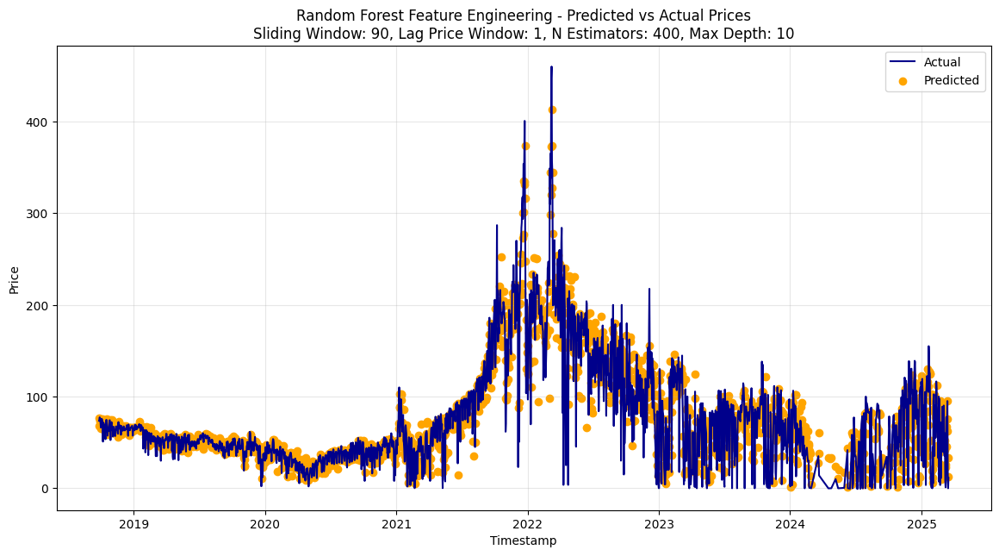

In [12]:
import matplotlib.pyplot as plt
# Plotting the predictions for the best model as scatter plot over the actuals as line plot
plt.figure(figsize=(14, 7))
plt.plot(prediction_df_most_optimal_fe['Timestamp'], prediction_df_most_optimal_fe['Actual'], label='Actual', color='darkblue')
plt.scatter(prediction_df_most_optimal_fe['Timestamp'], prediction_df_most_optimal_fe['Predicted'], label='Predicted', color='orange')
plt.title(f"Random Forest Feature Engineering - Predicted vs Actual Prices\nSliding Window: {most_optimal_fe_sliding_window}, Lag Price Window: {most_optimal_fe_lag_price_window}, N Estimators: {most_optimal_fe_n_estimators}, Max Depth: {most_optimal_fe_max_depth}")
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig('random_forest_fe_best_model.png', dpi=300, bbox_inches='tight')
plt.show()
